CID:01854788

In [1]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.1 MB/s eta 0:00:00


In [1]:
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np
import torch
from torch.optim import Adam
from torch import nn
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
from torch.optim import Adam
from torch.optim import SGD

torch.cuda.manual_seed(0)
np.random.seed(0)


### Part 1. On attention [2 points]

Answer each question in max. 3 lines. Points will be subtracted for long answers so be short and precise. Add your explanations in the below box - NO added handwritten images, write in latex!

1. [0.5 point] You are given an input $X=[x_1,...,x_L]$ (e.g. a sentence of tokenised words). Your goal is to predict the next token $x_i$ conditional on $x_{1},...,x_{i}$. In other words, the $i$-th position can only be influenced by a position $j$ if and only if $j \leq i$, namely a position cannot be influenced by the subsequent positions.
    a. What would be the problem when passing $X$ through attention? Explain using the computations that attention performs, e.g. you can write out the matrix multiplication.
    b. How could you ensure that the prediction for position $i$ depends solely on positions $j\leq i$? Hint: what in the attention computation should be masked & in what way?
2. [0.5 point] Let's consider multi-head attention. How does multi-head attention change the computations inside the softmax (the $QK^T$ term) and the product with $V$ and why could this be beneficial to learning?
3. [0.5 point] Remember that standard attention is given by
\begin{align}
Q = XW^Q, \; K=XW^K, \; V=XW^V, \;\; \text{with} A(X) = softmax\left(\frac{QK^T}{\sqrt{D}}\right)V
\end{align}
for a sequence $X\in\mathbb{R}^{L\times D}$ with $L$ the sequence length.
What is the memory and computational cost of attention in terms of the sequence length and where does this come from?
4. [0.5 point] A big focus these days is on making attention more computationally efficient. The $i$-th row (as a vector) of attention can be rewritten as,
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L sim(Q_i,K_j)V_j}{\sum_{j=1}^L sim(Q_i,K_j)},
\end{align}
with $sim(q,k)=exp(q^Tk/\sqrt{D})$.
Linear attention would be given by,
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L \phi(Q_i)^T\phi(K_j)V_j}{\sum_{j=1}^L\phi(Q_i)^T\phi(K_j)}.
\end{align}
Explain the relation between regular attentin and linear attention (i.e. what kind of similarity function does linear attention assume and how is the approximation made?) & how the above expression can be rewritten and use this to explain why linear attention computation can be done more efficiently compared to standard attention.

1. The formula for attention is given by Attention(Q, K, V) = softmax $(\frac{QK^T}{\sqrt{d_k}})V$. Using the identity that $Q = XW^Q$, $K = XW^K $ and $V = XW^V$. Thus we see that within the softmax function we have $$[QK^T]_{ij} = \sum_k Q_{ik}K^T_{kj} = \sum_k [XW^Q]_{ik}[XW^K]^T_{kj} = \sum_k \sum_m[X_{im}W^Q_{mk}]\sum_l[X_{kl}W^K_{lj}]^T$$ shows dependence of all vectors $$x_1, ..., x_L$$ on the attention calculation. To counter this we could use a restricted matrix at each step to compute the attention at a certain position, this would be equivalent to zeroing out any colomns j>i for the i'th attention value.

2. In the mutlihead approach we use h-heads to linearly project the input X into h linearly projected layers where each $\text{head}_i = Attention(QW_i^Q, KW_i^K, VW_i^V)$. We then concatenate these h heads together and project with a final matrix W^0 into the final output. This changes the computation as we are using h projections rather than one large matrix multiplication, this allows us to better express features of the data and it also does not increase computational cost as we run the matrix multiplications in parallel for each head.

3. The computational cost of attention is O(max($L^2d_k, Ldd_k$)). This comes from the fact we must perform three matrix multiplications of $X \in \mathbb{R}^{L \times d}$  with $W^Q$, $W^K$ and $W^V$ $\in \mathbb{R}^{d \times d_k}$ which is of order $O(Ldd_k)$ we then must also multiply Q and K which is of order $O(L^2d_k)$. The order of the softmax function in this case is O(L) and the final matrix multiplication is $O(L^2d_k)$

4. We can write the sim function as $sim(q_i,k_j)=exp(q_i^Tk_j/\sqrt{D})$. We can approximate $exp(q_i^Tk_j)$ by $1 + \frac{q_i^Tk_j}{\sqrt D}$ which we normalise by the l2 norm to guarantee non-negativity. $sim(q_i,k_j) \approx 1 + \frac{1}{\sqrt D}\left(\frac{\mathbf{q}_i}{\| \mathbf{q}_i \|_2}  \right)^T \left( \frac{\mathbf{k}_j}{\| \mathbf{k}_j \|_2} \right)$. Where the $\sqrt D$ factor cancels out in the denominator term and the $\phi$ function is given by the normalisation function. Linear attention simplifies the function by removing the exponential and so we can compute linear attention through a single vector multiplication.

### Part 2. On diffusion models [12 points]

We will be implementing a diffusion model. We will follow mostly the setup as done here: https://arxiv.org/pdf/2006.11239.pdf so please refer to this work for more details if needed.

Your goal will be to implement the code for the diffusion model, find the right configuration to train the model, achieve good accuracy and efficiency and finally interpret how the model learns. You will be marked on clean code, concise answers and good results.

We will be working with the FashionMNIST dataset. You can load the data using the below code.

In [2]:
IMG_SIZE = 28
BATCH_SIZE = 128

dataset = load_dataset("fashion_mnist")
channels = 1

transform = Compose([
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Lambda(lambda t: (t * 2) - 1)
])

# define function
def transforms(examples):
    examples["pixel_values"] = [transform(image.convert("L")) for image in examples["image"]]
    del examples["image"]
    return examples

transformed_dataset = dataset.with_transform(transforms).remove_columns("label")

dataloader = DataLoader(transformed_dataset['train'], batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

##### 1. The noising process [2 points]

[1.5 pts] Our first step will be to implement the forward process that adds noise to an image.

We will be adding noise according to a linear schedule, i.e. the noises $\beta_t$, $t=1,...,T$ will come from an equally spaced vector. Implement the `linear_beta_schedule` function. Remember $\alpha_t = 1-\beta_t$ and $\bar \alpha_t = \prod_{s=1}^t \alpha_s$.

Remember that we have the closed-form solutions for the image at time $t$. Use those in the implementation of `forward_diffusion_sample` instead of a for loop over each noising step. This means you will need to implement `sqrt_one_minus_alphas_cumprod` which represents $\sqrt{1-\bar\alpha_t}$ and `sqrt_alphas_cumprod` which represents $\sqrt{\bar\alpha_t}$.

Test the function on an image from the dataset using the given code below.

cpu


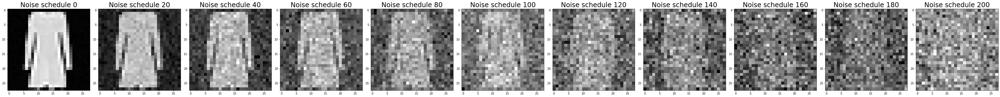

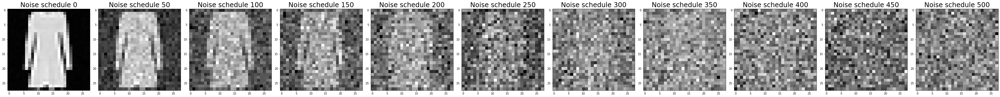

In [3]:
import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)


def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps).to(device)


def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t)
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(device)


def forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    x_0 = x_0.to(device)

    noise = torch.randn_like(x_0)
    sac_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    somac_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)

    x_t = torch.normal(sac_t * x_0, somac_t)
    return x_t, (x_t - x_0)


def alpha_cumprod_func(alphas):
    alphas_cumprod = torch.cumprod(alphas, dim=0).to(device)
    return alphas_cumprod, torch.sqrt(alphas_cumprod), torch.sqrt(1 - alphas_cumprod)


T = 300
betas = linear_beta_schedule(timesteps=T).to(device)
alphas = 1 - betas
alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = alpha_cumprod_func(alphas)


# Simulate forward diffusion
def plot_beta_schedule(num_images, stepsize, batch):
    fig, ax = plt.subplots(1, num_images + 1, figsize=(50, 6))
    T = num_images * stepsize + 1
    betas = linear_beta_schedule(timesteps=T).to(device)
    alphas = 1 - betas
    alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = alpha_cumprod_func(alphas)

    for im_num in range(0, num_images + 1):
        idx = im_num * stepsize
        t = torch.Tensor([idx]).type(torch.int64).to(device)
        img, noise = forward_diffusion_sample(batch[0, :, :, :].to(device), t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

        img = img.cpu().numpy()
        ax[im_num].imshow(img.reshape(28, 28), cmap="gray")
        ax[im_num].set_title(f"Noise schedule {idx}", fontsize=24)
    plt.tight_layout()
    plt.show()


batch = next(iter(dataloader))["pixel_values"]

plot_beta_schedule(10, 20, batch)
plot_beta_schedule(10, 50, batch)


[0.5 pt] Play around with the noise (compare two different beta schedules), present results for the two settings and discuss (in max. 3 lines) how the hyperparameters change the forward sampling.

The forward process is parameterised by $q(x_t|x_0) = \mathcal{N}(x_t; \sqrt{\overline{\alpha_t}}x_0, (1-\overline{\alpha_t})I)$. $\overline{\alpha_t} = \prod_{s=1}^t (1 - \beta_s)$ Changing T in the function changes the number of timesteps of noise we have which in turn changes the scaling value of the mean and variance. Below I have printed the mean and sd of different beta schedules, by increasing T we bring the mean of the distribution closer to 0 (pure noise) and increase the variance closer to 1, which also leads to noisier samples.

In [5]:
T_ = 1000
betas = linear_beta_schedule(T_).to(device)
alphas = 1 - betas
ac, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = alpha_cumprod_func(alphas)
print("Final mean and standard deviation scale factor with T=1000 respectively: ", float(sqrt_alphas_cumprod[-1]),", ", float(sqrt_one_minus_alphas_cumprod[-1]))


T =300
betas = linear_beta_schedule(timesteps=T).to(device)
alphas = 1 - betas
ac, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = alpha_cumprod_func(alphas)
print("Final mean and standard deviation scale factor with T=300 respectively: ", float(sqrt_alphas_cumprod[-1]),", ", float(sqrt_one_minus_alphas_cumprod[-1]))

Final mean and standard deviation scale factor with T=1000 respectively:  0.006352817639708519 ,  0.9999797940254211
Final mean and standard deviation scale factor with T=300 respectively:  0.2192222774028778 ,  0.9756749272346497


##### 2. The model for the noise [4 points]

We use a simple form of a UNet to predict the noise in the image. The input into the neural network will be a noisy image and the ouput from the model will be the noise in the image. It is important to also pass in the timestep into the neural network (so the model knows at which time we want to denoise the image) and we do this by passing it through a sinusoidal position embedding.

[0.5pt] Write code for the Sinusoidal Position Embedding. This should output a matrix $PE$ of size `[timesteps, dimension]` with elements:

\begin{align}
&PE_{pos,2i} = \sin\left(\frac{pos}{10000^{2i/dim}}\right),\\
&PE_{pos,2i+1} = \cos\left(\frac{pos}{10000^{2i/dim}}\right),
\end{align}
where `pos` refers to the time position and `i` refers to the dimension position and `dim` the total dimension we are working with.

Use however the following identity to implement:
\begin{align}
\frac{pos}{10000^{2i/dim}} = \exp\left(\log(pos) - \frac{2i}{dim}\log(10000)\right).
\end{align}

In [4]:
# Check if CUDA is available, otherwise use CPU
device = "cuda" if torch.cuda.is_available() else "cpu"

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        t = time.shape[0]
        PE = torch.zeros(t, self.dim, device=device)
        pos = torch.arange(0, t, device=device).unsqueeze(1)
        i_term = torch.exp(-(torch.arange(0, self.dim, 2, device=device).float() / self.dim) * np.log(10000))
        PE[:, 1::2] = torch.cos(pos * i_term)
        PE[:, ::2] = torch.sin(pos * i_term)
        return PE.to(device)


[0.5pt] Visualise the positional embeddings with arbitary time and dimension and discuss what position embeddings do (why do we add them, why this particular embedding structure) in max. 3 lines.

Positional embeddings inform the model of its poisiton within a sequence, this is an essential part of the model as it informs the model of how much noise is still in the image. We use this particular structure as distances between time steps with different lengths remains constant and the model generalises to longer sequences easily meaning we can vary the number of timesteps as a hyperparameter.

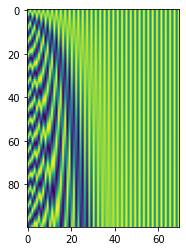

In [5]:
visual_example = SinusoidalPositionEmbeddings(70)
time_vec = torch.tensor([i for i in range(100)])
plt.imshow(visual_example(time_vec))

[0.5pt] Add here an explanation as to what the block does including the up and downsample operations in maximum 3 lines:

In the block function we apply a linear map to the time data so that it can be added to the tensor at each stage. The rest of the block is a combination of convolutions, which learn features of the data e.g. shapes and colours (in the down block this is an encoding), BatchNorm which normalises the data (a good practise in any model), ReLU functions which add non-linearity to the model and ConvTranspose which acts as a way to increase the dimension of the input with learnable parameters in order to recreate/decode the information back into an image.  


In [6]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch).to(device)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1).to(device)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1).to(device)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1).to(device)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1).to(device)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1).to(device)
        self.bnorm1 = nn.BatchNorm2d(out_ch).to(device)
        self.bnorm2 = nn.BatchNorm2d(out_ch).to(device)
        self.relu = nn.ReLU().to(device)

    def forward(self, x, t):
        h = self.bnorm1(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm2(self.relu(self.conv2(h)))
        return self.transform(h)


[1.5pt] Use the above code to fill in the code for the UNet below.

In [7]:
class SimpleUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 1
        down_channels = (32, 64, 100)
        up_channels = (100, 64, 32)
        out_dim = 1
        time_emb_dim = 24

        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        ).to(device)

        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1).to(device)

        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1],
                                          time_emb_dim) for i in range(len(down_channels)-1)]).to(device)

        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1],
                                        time_emb_dim, up=True) for i in range(len(up_channels)-1)]).to(device)

        self.output = nn.Conv2d(up_channels[-1], out_dim, 1).to(device)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_connect = []
        for down in self.downs:
            x = down(x, t)
            residual_connect.append(x)
        for up in self.ups:
            residual_x = residual_connect.pop()
            if residual_x.shape != x.shape:
                x = F.pad(x, (1, 0, 1, 0, 0, 0, 0, 0))
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)



[0.5pt] Finally, define a loss function. Note that this loss function should take x_0 and t to sample the forward diffusion model, get a noisy image, use this noisy image in the model to get the noise added and finally compare true added noise and model outputs added noise.

In [8]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    noise_pred = model(x_noisy, t)
    return F.mse_loss(noise, noise_pred)


##### Part 3: The sampling [1 point]

Write a piece of code that can be used to predict the noise and return the denoised image. This function should work on a single image and make sure that the function can be used in the `sample` function properly. Note that we will need the `posterior_variance` denoted by $\sigma$ in the paper and the `sqrt_recip_alphas` given by $1/\alpha_t$. Make sure to set the right choice of $\sigma$ (see the paper).

In [9]:

torch.cuda.manual_seed(0)
np.random.seed(0)
# compute posterior_variance
alphas_cumprod_shift = F.pad(alphas_cumprod[:-1], (1, 0), value=1)
posterior_variance = betas * (1 - alphas_cumprod_shift)/(1- alphas_cumprod)
sqrt_recip_alphas = torch.sqrt(1 / alphas)

@torch.no_grad()
def sample_timestep(model, x, t, i, posterior_variance, sqrt_one_minus_alphas_cumprod ):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    Note that it also needs additional arguments about the posterior_variance, sqrt_minus_alphas_cumprod and sqrt_recip_alphas.
    """
    beta = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alpha_cumprod = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alpha = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    post_var = get_index_from_list(posterior_variance, t, x.shape)
    pred_noise = model(x, t)
    x = sqrt_recip_alpha * (x - (beta * pred_noise / sqrt_one_minus_alpha_cumprod))
    if i==0:
      return x
    else:
      z = torch.randn_like(x)
      #x += torch.sqrt(post_var) * z
      x += post_var * z
    return x

@torch.no_grad()
def sample(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn((b, 1, 28, 28), device=device)
    imgs = []
    for i in tqdm(reversed(range(0, T)), desc='sampling loop time step', total=T):
        t = torch.full((b,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t, i, posterior_variance, sqrt_one_minus_alphas_cumprod)
        imgs.append(img.cpu().numpy())
    return imgs


Full Model Code

In [12]:
#Full model with more params

torch.cuda.manual_seed(0)
np.random.seed(0)
class FullUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 1
        down_channels = (32, 64, 128)
        up_channels = (128, 64, 32)
        out_dim = 1
        time_emb_dim = 24

        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        ).to(device)

        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1).to(device)

        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1],
                                          time_emb_dim) for i in range(len(down_channels)-1)]).to(device)

        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1],
                                        time_emb_dim, up=True) for i in range(len(up_channels)-1)]).to(device)

        self.output = nn.Conv2d(up_channels[-1], out_dim, 1).to(device)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_connect = []
        for down in self.downs:
            x = down(x, t)
            residual_connect.append(x)
        for up in self.ups:
            residual_x = residual_connect.pop()
            if residual_x.shape != x.shape:
                x = F.pad(x, (1, 0, 1, 0, 0, 0, 0, 0))
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

full_model = FullUnet().to(device)

full_model.to(device)
optimizer = Adam(full_model.parameters(), lr=0.001)
epochs = 50

#Training Loop
for epoch in range(epochs):
    dataloader = tqdm(dataloader)
    for i, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(full_model, batch["pixel_values"], t)
      loss.backward()
      optimizer.step()
    print(f"Epoch {epoch}, Loss: {loss.item()} ")



100%|██████████| 468/468 [00:24<00:00, 19.19it/s]


Epoch 0, Loss: 0.06862302869558334 


100%|██████████| 468/468 [00:21<00:00, 21.31it/s]


Epoch 1, Loss: 0.06512504816055298 


100%|██████████| 468/468 [00:22<00:00, 20.69it/s]


Epoch 2, Loss: 0.06876485794782639 


100%|██████████| 468/468 [00:25<00:00, 18.27it/s]


Epoch 3, Loss: 0.06767340004444122 


100%|██████████| 468/468 [00:23<00:00, 20.27it/s]


Epoch 4, Loss: 0.06741824001073837 


100%|██████████| 468/468 [00:22<00:00, 21.16it/s]


Epoch 5, Loss: 0.05632910504937172 


100%|██████████| 468/468 [00:20<00:00, 23.00it/s]


Epoch 6, Loss: 0.06819620728492737 


100%|██████████| 468/468 [00:25<00:00, 18.32it/s]


Epoch 7, Loss: 0.07170234620571136 


100%|██████████| 468/468 [00:24<00:00, 18.81it/s]


Epoch 8, Loss: 0.06842014193534851 


100%|██████████| 468/468 [00:24<00:00, 19.35it/s]


Epoch 9, Loss: 0.05904591828584671 


100%|██████████| 468/468 [00:23<00:00, 20.23it/s]


Epoch 10, Loss: 0.06983817368745804 


100%|██████████| 468/468 [00:24<00:00, 19.37it/s]


Epoch 11, Loss: 0.058121923357248306 


100%|██████████| 468/468 [00:23<00:00, 19.51it/s]


Epoch 12, Loss: 0.06372922658920288 


100%|██████████| 468/468 [00:34<00:00, 13.50it/s]


Epoch 13, Loss: 0.061740707606077194 


100%|██████████| 468/468 [00:23<00:00, 19.58it/s]


Epoch 14, Loss: 0.061675652861595154 


100%|██████████| 468/468 [00:23<00:00, 20.26it/s]


Epoch 15, Loss: 0.06705203652381897 


100%|██████████| 468/468 [00:30<00:00, 15.60it/s]


Epoch 16, Loss: 0.053837843239307404 


100%|██████████| 468/468 [00:27<00:00, 16.91it/s]


Epoch 17, Loss: 0.055227622389793396 


100%|██████████| 468/468 [00:24<00:00, 19.50it/s]


Epoch 18, Loss: 0.06861724704504013 


100%|██████████| 468/468 [00:20<00:00, 22.44it/s]


Epoch 19, Loss: 0.05481235682964325 


100%|██████████| 468/468 [00:20<00:00, 22.50it/s]


Epoch 20, Loss: 0.06803232431411743 


100%|██████████| 468/468 [00:21<00:00, 21.59it/s]


Epoch 21, Loss: 0.05003475397825241 


100%|██████████| 468/468 [00:21<00:00, 21.68it/s]


Epoch 22, Loss: 0.058630671352148056 


100%|██████████| 468/468 [00:20<00:00, 22.31it/s]


Epoch 23, Loss: 0.06540518254041672 


100%|██████████| 468/468 [00:31<00:00, 14.78it/s]


Epoch 24, Loss: 0.07069795578718185 


100%|██████████| 468/468 [00:23<00:00, 19.68it/s]


Epoch 25, Loss: 0.06511510908603668 


100%|██████████| 468/468 [00:22<00:00, 20.43it/s]


Epoch 26, Loss: 0.06674419343471527 


100%|██████████| 468/468 [00:24<00:00, 18.78it/s]


Epoch 27, Loss: 0.056399744004011154 


100%|██████████| 468/468 [00:26<00:00, 17.93it/s]


Epoch 28, Loss: 0.059462770819664 


100%|██████████| 468/468 [00:32<00:00, 14.26it/s]


Epoch 29, Loss: 0.05545031279325485 


100%|██████████| 468/468 [00:20<00:00, 22.39it/s]


Epoch 30, Loss: 0.06425996869802475 


100%|██████████| 468/468 [00:25<00:00, 18.20it/s]


Epoch 31, Loss: 0.06944111734628677 


100%|██████████| 468/468 [00:25<00:00, 18.48it/s]


Epoch 32, Loss: 0.05358264222741127 


100%|██████████| 468/468 [00:22<00:00, 21.20it/s]


Epoch 33, Loss: 0.05969499796628952 


100%|██████████| 468/468 [00:20<00:00, 22.45it/s]


Epoch 34, Loss: 0.0579952597618103 


100%|██████████| 468/468 [00:20<00:00, 22.46it/s]


Epoch 35, Loss: 0.05108495056629181 


100%|██████████| 468/468 [00:20<00:00, 22.37it/s]


Epoch 36, Loss: 0.05441713333129883 


100%|██████████| 468/468 [00:20<00:00, 22.36it/s]


Epoch 37, Loss: 0.0571608766913414 


100%|██████████| 468/468 [00:21<00:00, 21.64it/s]


Epoch 38, Loss: 0.05742653086781502 


100%|██████████| 468/468 [00:20<00:00, 22.34it/s]


Epoch 39, Loss: 0.05072780326008797 


100%|██████████| 468/468 [00:20<00:00, 22.31it/s]


Epoch 40, Loss: 0.06873836368322372 


100%|██████████| 468/468 [00:21<00:00, 22.19it/s]


Epoch 41, Loss: 0.05528458207845688 


100%|██████████| 468/468 [00:20<00:00, 22.45it/s]


Epoch 42, Loss: 0.059575051069259644 


100%|██████████| 468/468 [00:20<00:00, 22.71it/s]


Epoch 43, Loss: 0.05481654778122902 


100%|██████████| 468/468 [00:20<00:00, 22.41it/s]


Epoch 44, Loss: 0.06408457458019257 


100%|██████████| 468/468 [00:21<00:00, 22.17it/s]


Epoch 45, Loss: 0.06805670261383057 


100%|██████████| 468/468 [00:20<00:00, 22.78it/s]


Epoch 46, Loss: 0.05513640120625496 


100%|██████████| 468/468 [00:20<00:00, 22.52it/s]


Epoch 47, Loss: 0.05561260133981705 


100%|██████████| 468/468 [00:20<00:00, 22.42it/s]


Epoch 48, Loss: 0.06288359314203262 


100%|██████████| 468/468 [00:20<00:00, 22.37it/s]

Epoch 49, Loss: 0.07065363973379135 


Full Model Samples

sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 153.44it/s]


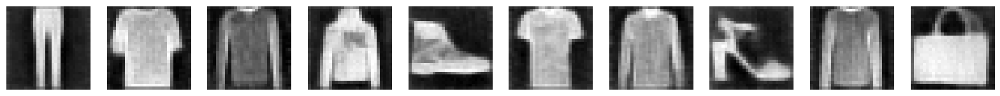

In [16]:

torch.cuda.manual_seed(0)
np.random.seed(0)
num_samples = 50
sample_val =sample(full_model, (num_samples ,1,  28, 28))
best_indices = [14, 3, 4, 6, 12, 16, 23, 45, 29, 37]
selected_matrices = torch.index_select(torch.tensor(sample_val[-1]), dim=0, index=torch.tensor(best_indices))

fig, ax = plt.subplots(1, 10, figsize=(20, 8))
for img_num, img in enumerate(selected_matrices):
  ax[img_num].imshow(img.reshape(28, 28), cmap="gray")
  ax[img_num].axis("off")

plt.show()

Efficient Implementation

In [17]:
#Efficient model

torch.cuda.manual_seed(0)
np.random.seed(0)
model = SimpleUnet().to(device)
print("Number of parameters: ", sum(p.numel() for p in model.parameters()))

model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 13

for epoch in range(epochs):
    dataloader = tqdm(dataloader)
    for i, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch["pixel_values"], t)
      loss.backward()
      optimizer.step()
    print(f"Epoch {epoch}, Loss: {loss.item()} ")

Number of parameters:  717769


100%|██████████| 468/468 [00:19<00:00, 24.37it/s]


Epoch 0, Loss: 0.06665447354316711 


100%|██████████| 468/468 [00:19<00:00, 24.44it/s]


Epoch 1, Loss: 0.0653168335556984 


100%|██████████| 468/468 [00:18<00:00, 24.93it/s]


Epoch 2, Loss: 0.06054031476378441 


100%|██████████| 468/468 [00:19<00:00, 24.12it/s]


Epoch 3, Loss: 0.07060059905052185 


100%|██████████| 468/468 [00:19<00:00, 23.71it/s]


Epoch 4, Loss: 0.06830337643623352 


100%|██████████| 468/468 [00:19<00:00, 24.06it/s]


Epoch 5, Loss: 0.05706923082470894 


100%|██████████| 468/468 [00:19<00:00, 23.93it/s]


Epoch 6, Loss: 0.06797473132610321 


100%|██████████| 468/468 [00:19<00:00, 24.60it/s]


Epoch 7, Loss: 0.06838370859622955 


100%|██████████| 468/468 [00:19<00:00, 23.82it/s]


Epoch 8, Loss: 0.06813927739858627 


100%|██████████| 468/468 [00:19<00:00, 23.98it/s]


Epoch 9, Loss: 0.05582798644900322 


100%|██████████| 468/468 [00:19<00:00, 23.90it/s]


Epoch 10, Loss: 0.0633995532989502 


100%|██████████| 468/468 [00:19<00:00, 23.61it/s]


Epoch 11, Loss: 0.062015436589717865 


100%|██████████| 468/468 [00:19<00:00, 24.23it/s]

Epoch 12, Loss: 0.06335032731294632 


10 Best Samples - efficient Implementation.
Here the model has only been ran for 13 epochs with 717,769 parameters.

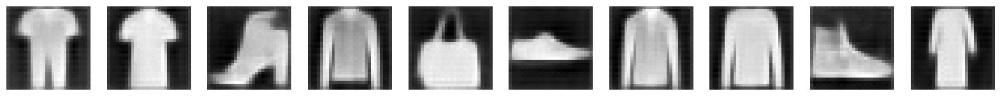

In [27]:
#num samples to be a multiple of 10
torch.cuda.manual_seed(1)
np.random.seed(1)
best_indices = [54, 8, 15, 16, 19, 21, 35, 39, 53, 70]
selected_matrices = torch.index_select(torch.tensor(sample_val[-1]), dim=0, index=torch.tensor(best_indices))

fig, ax = plt.subplots(1, 10, figsize=(20, 8))
for img_num, img in enumerate(selected_matrices):
  ax[img_num].imshow(img.reshape(28, 28), cmap="gray")
  ax[img_num].axis("off")

plt.show()

To better understand how the model learns we are interested in analysing samples during the training process, to do this we create a new model an display the images for the first set of epochs


100%|██████████| 468/468 [07:49<00:00,  1.00s/it]


Epoch 0, Loss: 0.08265553414821625 


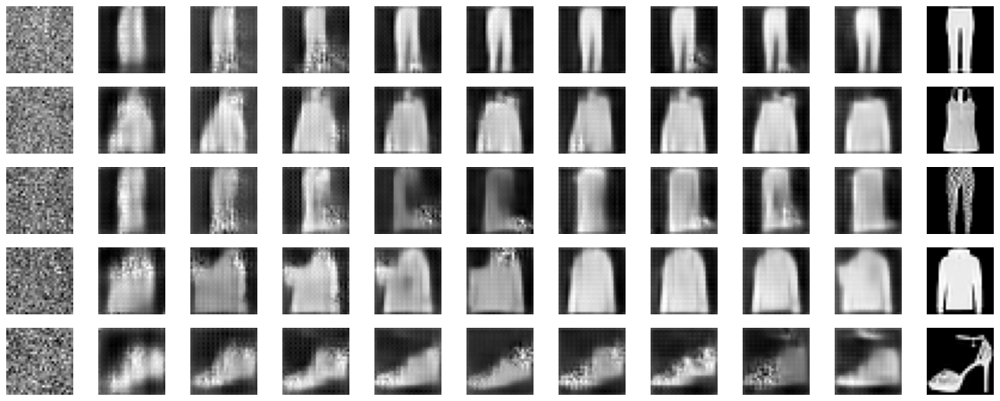

In [23]:
@torch.no_grad()
def sample_train(model, x, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = x.to(device)
    imgs = []
    for i in tqdm(reversed(range(0, T)), desc='sampling loop time step', total=T):
        t = torch.full((b,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t, i, posterior_variance, sqrt_one_minus_alphas_cumprod)
        imgs.append(img.cpu().numpy())
    return imgs

model_train = SimpleUnet().to(device)
model_train.to(device)
optimizer = Adam(model_train.parameters(), lr=0.001)
epochs = 1
counter = 0
T = 300
betas = linear_beta_schedule(timesteps=T).to(device)
alphas = 1 - betas
alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = alpha_cumprod_func(alphas)

batch = next(iter(dataloader))["pixel_values"]
x = batch[:5, :, :, :]
t = torch.Tensor([299]).type(torch.int64).to(device)
x_noise, noise = forward_diffusion_sample(x, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
fig, ax = plt.subplots(5, 11, figsize=(20, 8))
for epoch in range(epochs):
    dataloader = tqdm(dataloader)
    for i, batch in enumerate(dataloader):
      optimizer.zero_grad()
      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      #every 10 batches plot a training sample
      if i%50 ==0 and counter <10:
        counter += 1
        train_ex = sample_train(model_train, x_noise, x_noise.shape)
        for img_num, img in enumerate(train_ex[-1]):
          ax[img_num, i//50].imshow(img.reshape(28, 28), cmap="gray")
          ax[img_num, i//50].axis("off")

      loss = get_loss(model_train, batch["pixel_values"], t)
      loss.backward()
      optimizer.step()
    print(f"Epoch {epoch}, Loss: {loss.item()} ")
#final train sample
for img_num, img in enumerate(train_ex[-1]):
  ax[img_num, 9].imshow(img.reshape(28, 28), cmap="gray")
  ax[img_num, 9].axis("off")
#plot true samples
for img_num, img in enumerate(x):
  ax[img_num, 10].imshow(img.reshape(28, 28), cmap="gray")
  ax[img_num, 10].axis("off")
plt.show()

Here we plot the same 5 samples after every 50 batch updates during training - the final coloumn shows us the true image. The plot shows us what the model learns about the images first and how it gradually updates to be able to regenerate the true training images. As we can see from the plot, the model first learns very generic shapes but after each training iteration the shape becomes closer to that of a clothing item. As we can see from the image of the shoe, the model struggles to learn more complex and irregular shapes however performs suprisingly well after just 1 epoch on more rectangular items of clothing i.e the shirt.  As we know from the full and efficient model, the model eventually learns these more complex shapes after enough optimiser iterations. The reason the model learns outline/shapes of the objects first is that it leads to the greates reduction in loss. The model then begins to shape these images more accurately and after enough epochs we see more color information becoming present in the images, this is clear from a comparison of the images developed by the simple model and those generated by the full model.

### Part 3. On DeepDream [5 points]

In this task we will implement a DeepDream model in order to generate ‘dreams’: images enhanced by the neural network.

Here we will work with a pre-trained model (Inception-V3). The idea is as follows: we will load some image (you can later on choose to load your own image if you want). We will load the Inception-V3 model. We will pass it an input and obtain the activation outputs from a certain layer. We will 'ask' the neural network to maximise the values of the activation, i.e. enhance the image with what those layer activations 'like' to see. For this we will implement a gradient ascent method in order to maximise a norm of the activations over that input. This will change our input into a `dream'.

1. [1 point] Write a piece of code that will load the Inception-V3 model and allow you to get access to the intermediate activations.

2. [2 points] Implement the deepdream optimisation loop. We will use gradient ascent to optimise for the norm of the activation. Implement a function that performs this gradient ascent. This function will take as input the number of iterations to perform, the learning rate, and the start image (i.e. the image which the model will enhance). Define in the function a for loop over the number of iterations, obtain the model output, get the output of the hook (hint: use something like `outputs[-1]`), compute the loss which will be L2 norm of this output (i.e. the L2 norm of the activations from your chosen layer), compute the gradients of this L2 norm loss, scale the gradients by their absolute average (hint: scale using `torch.abs(g).mean()`) and define a gradient ascent step over the image. Do not forget to zero out gradients where needed.

3. [1 point] Implement code to load an image (e.g. https://github.com/pytorch/hub/raw/master/images/dog.jpg) and display the output from your optimisation loop (using e.g. numpy). Present the generated images for different choices of layer activations and different number of optimisation steps. Discuss your results. What is the impact of using different layers? What is the impact of the number of optimisation steps? [0.5 point will be given for the implementation and 1.5 point for a very good discussion]

4. [1 point] In our previous setting we allowed for optimising for a single layer's activation. Change the method such that it will allow to compute the loss (L2 norm) of multiple layers' outputs. Present three different setups using different numbers & combinations of layers and discuss your results in max. 3 lines.

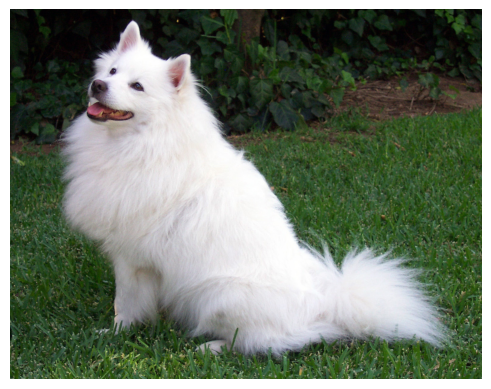

In [ ]:
from PIL import Image
from torchvision import transforms
import urllib
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np
import torch
from torch.optim import Adam
from torch import nn
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
import matplotlib.pyplot as plt
import math
from tqdm import tqdm

url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg","dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

input_img = Image.open(filename)
plt.imshow(input_img)
plt.axis('off')
plt.show()

#Mean and standard deviation of Imagenet images (which is what inception v3 is trained on)
mean_vec=[0.485, 0.456, 0.406]
std_vec=[0.229, 0.224, 0.225]
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_vec,
    std=std_vec),
])
#Tensor to train on
input_tensor = preprocess(input_img)
input_batch = input_tensor.unsqueeze(0)

def batch_to_img(img_batch):
    return img_batch.detach().squeeze(0).permute(1,2,0).numpy()

def process(output):
    return output * std_vec + mean_vec

In [ ]:
#Load model
inception = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
#Use eval mode to turn of features of training (e.g. dropout etc. )
inception.eval()

#Layers of the model which we are interested in
layers = [inception.Conv2d_1a_3x3, inception.Conv2d_2a_3x3, inception.Mixed_5b, inception.Mixed_5c, inception.Mixed_6a, inception.Mixed_6b, inception.Mixed_6c, inception.Mixed_7b]
str_layers = ['Conv2d_1a_3x3', 'Conv2d_2a_3x3', 'Mixed_5b', 'Mixed_5c', 'Mixed_6a', 'Mixed_6b', 'Mixed_6c', 'Mixed_7b']


Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 121MB/s]


In [ ]:
def deepdream(model, input_batch, layer, itr, lr):
    # Register a forward hook to obtain the output of the chosen layer, this way we can perform gradient ascent
    outputs= []
    def hook_func(module, input, output):
      outputs.append(output)

    layer_hook = layer.register_forward_hook(hook_func)
    #Gradient for input image should be stored
    input_batch.requires_grad_(True)

    for _ in range(itr):
        #Zero gradients
        model.zero_grad()
        output = model(input_batch)
        #Compute loss of the activations from the layer we are interested in
        loss = torch.norm(outputs.pop())
        # Compute gradient
        loss.backward()
        #Scale gradients
        grad = input_batch.grad
        grad = grad/torch.abs(grad).mean()
        #Update the input tensor using gradient ascent
        input_batch.data += lr * grad
        #Zero gradients
        input_batch.grad.zero_()

    #Remove the forward hook
    layer_hook.remove()

    return batch_to_img(input_batch)

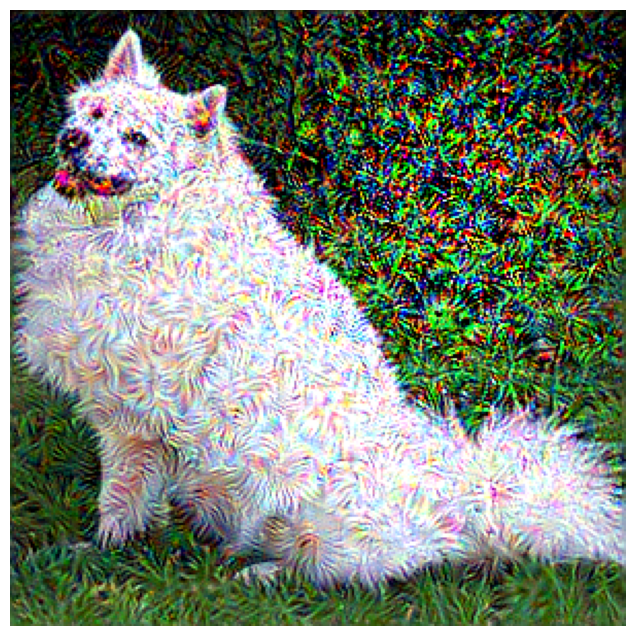

In [ ]:
#Pick a random layer
output1 = deepdream(inception, input_batch, inception.Mixed_7a, 20, 0.1)
output1 = process(output1)
plt.figure(figsize=(8,8))
plt.imshow(output1)
plt.axis('off')
plt.show()

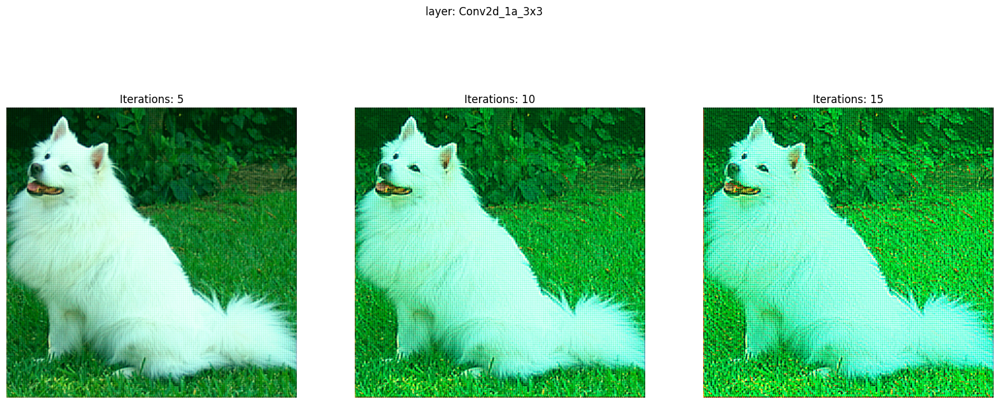

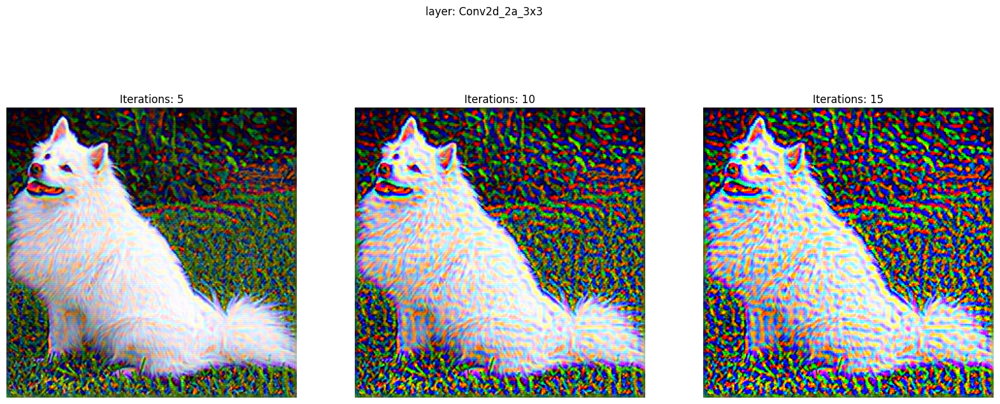

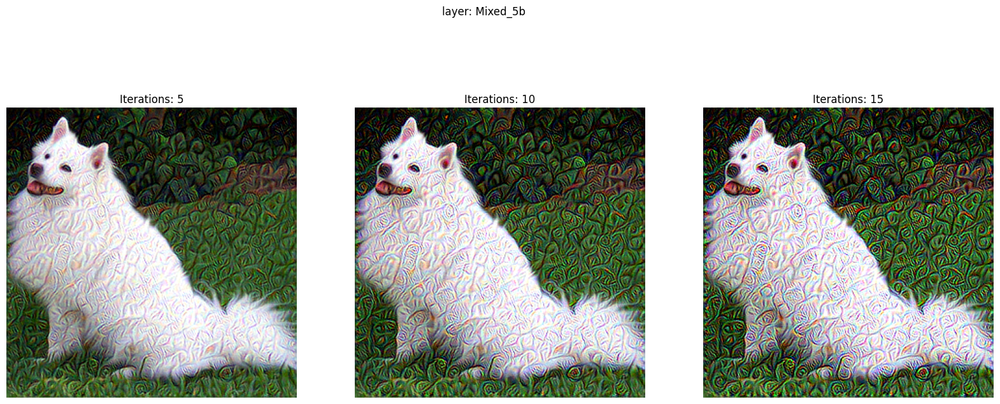

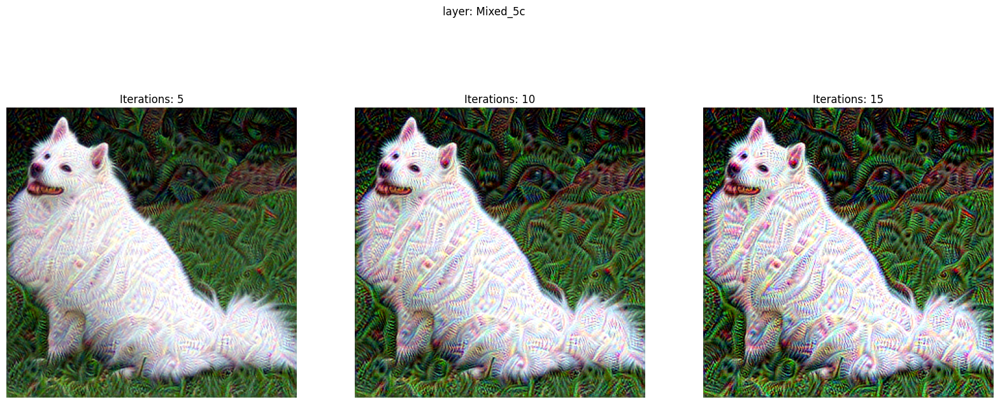

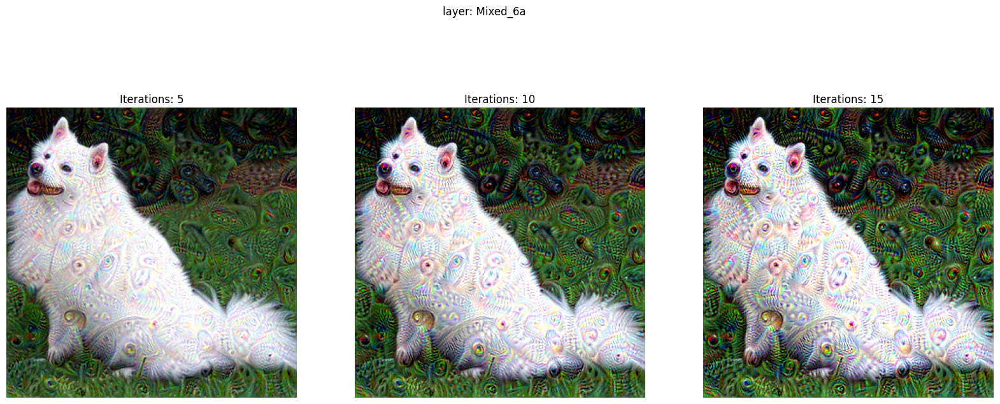

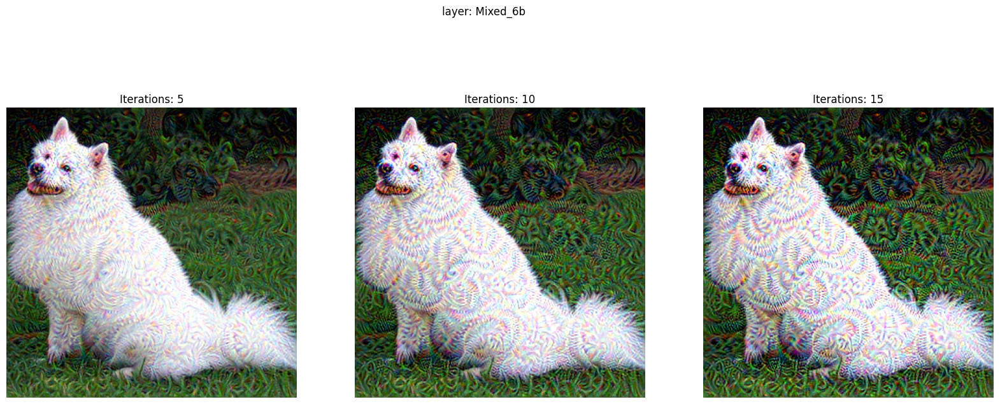

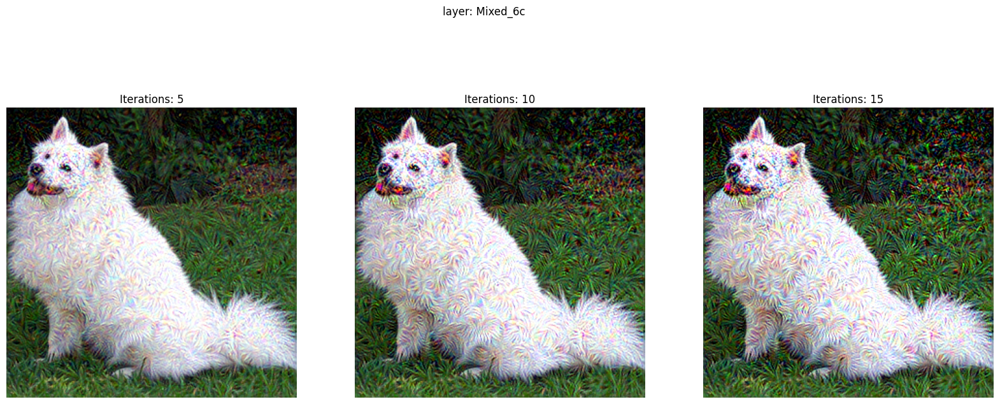

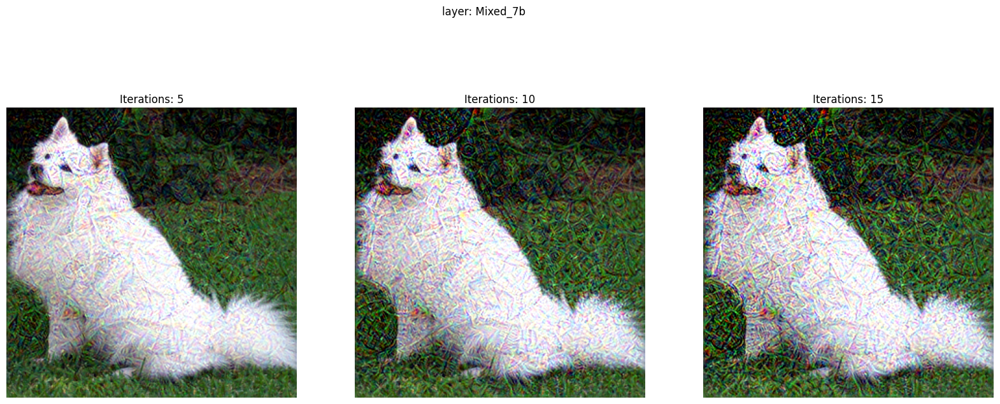

In [ ]:
#Number of iterations to perform gradient ascent for
num_iters = [5, 10, 15]
lr = 0.1

for j, layer in enumerate(layers):
    # Create subplots with 1 row and 3 columns
    fig, ax = plt.subplots(1, 3, figsize=(20, 8))

    # Set the title of the figure to the name of the current layer
    fig.suptitle(f'layer: {str_layers[j]}')

    # Loop over all iteration values
    for i, num_iter in enumerate(num_iters):

        #normalize image and convert to tensor
        input_tensor = preprocess(input_img)

        #Add batch dimension
        input_batch = input_tensor.unsqueeze(0)

        # Apply DeepDream
        output = deepdream(inception, input_batch, layer, num_iter, lr)

        #Convert to plottable image
        output = process(output)

        #Plot
        ax[i].imshow(output.clip(0, 1))
        ax[i].set_title(f"Iterations: {num_iter}")
        ax[i].axis('off')

    # Show the current figure
    plt.show()

The number of iterations directly impacts the amount of "deepdream" we see, as more iterations means more gradient ascent steps on the input tensor which wil (in general) maximise the activation from chosen layers - this will lead us closer to the maximum point in the loss landscape. Different layers in the model will be trained to pick up different patterns in the data ranging from more simple features such as color to more complex features such as complex shapes. We tend to see the more simple features getting picked up earlier on. Take for example the first and final layers conv2d_1a and Mixed_7b, The first layer simply has a coloring effect on the image. On the other hand the final layer is learning high dimensional and complex patterns and shapes - this is due to the heirarchial nature of a CNN.


In [ ]:
def deepdream_layers(model, input_batch, layers, iterations, lr):
    # Store the outputs of each layer
    outputs = []

    # Register a forward hook for each layer
    hooks = []
    for layer in layers:
        hook = layer.register_forward_hook(lambda module, input, output: outputs.append(output))
        hooks.append(hook)

    #Optimize the input image using gradient ascent
    input_batch.requires_grad_(True)
    for i in range(iterations):
        model.zero_grad()
        #Clear outputs
        outputs.clear()
        #compute outputs
        mod_output = model(input_batch)
        #Compute loss
        loss = sum(torch.norm(output) for output in outputs)
        loss.backward()
        #Scale
        g = input_batch.grad
        g = g / torch.abs(g).mean()
        # Update the input image using gradient ascent
        with torch.no_grad():
            input_batch.data += lr * g

        input_batch.grad.zero_()

    #Remove hooks
    for hook in hooks:
        hook.remove()

    return batch_to_img(input_batch)

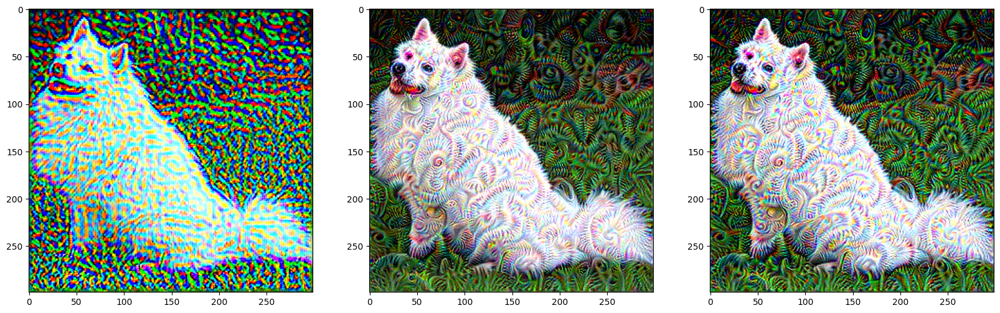

In [ ]:
multi_layers = [[inception.Conv2d_1a_3x3, inception.Conv2d_2a_3x3], [inception.Mixed_6a, inception.Mixed_6b, inception.Mixed_6c, inception.Mixed_7b, inception.Mixed_5b, inception.Mixed_5c],  [inception.Conv2d_1a_3x3, inception.Conv2d_2a_3x3, inception.Mixed_6a, inception.Mixed_6b, inception.Mixed_6c, inception.Mixed_7b, inception.Mixed_5b, inception.Mixed_5c]]
fig, ax = plt.subplots(1, 3, figsize=(20, 10))
for i in range(3):
    input_tensor = preprocess(input_img)
    input_batch = input_tensor.unsqueeze(0)
    output_i = deepdream_layers(inception, input_batch, multi_layers[i], 20, 0.1)
    output_i = process(output_i)
    ax[i].imshow(output_i)

The result of applying the deepdream model to multiple layers is that we see a combination of their activations in the images however the contribution of each activation also decreases since the loss function uses a sum of the norms of the activations and so we see a general increase in the dream like features. This is visibly clear from the first image which applies the first two layers, the second layer which applies the others and the last image which uses all of them. This highlights that only some features pass through the multilayer model.